# Explore the Error Space by Volcano and Error Type
**Author**: Ana M Tarano

**Last Modified**: July 31, 2025

**Description**: Converts all analyzed volcanoes to one merged csv that is compared to ground-truth data collected by science team.

## Load merged and cleaned table

In [1]:
import pandas as pd
import numpy as np
import os
import rasterio

# Load the merged results   
merged = pd.read_csv("merged_results_cleaned.csv")


In [2]:
def load_image(path):
    if not os.path.exists(path):
        print(f"Missing file: {path}")
        return np.full((200, 200), np.nan)
    with rasterio.open(path) as src:
        img = src.read(1)
        img = np.where(img == 2000, np.nan, img)
    return img

def plot_random_examples(volcano_name, df, category, num_samples=3):
    subset = df[df['category'] == category]
    if len(subset) == 0:
        print(f"No examples for {category}")
        return
    samples = subset.sample(min(num_samples, len(subset)))

    # Subplot: 3 columns now
    if len(samples) == 1:
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    else:
        fig, axs = plt.subplots(len(samples), 3, figsize=(15, 5 * len(samples)))
        
    fig.suptitle(f"{category} Examples", fontsize=16)

    for i, (_, row) in enumerate(samples.iterrows()):
        folder_path = row["Filename"]
        base_name = folder_path.split("/")[-1]
        volcano =  volcano_name.replace(" ", "_")  # Ensure volcano name is formatted correctly

        # Define paths
        lrx_path = os.path.join("../lrx_for_inference", volcano, base_name, 'lrx-bands=1-inner_window=3-outer_window=5/scores_raster_lrx.tif')
        subregion_path = os.path.join("../extracted_subregions_inference", volcano, base_name)
        original_path = os.path.join("../", row["Filename"])

        # Load images
        lrx = load_image(lrx_path)
        sub = load_image(subregion_path)
        orig = load_image(original_path)

        if len(samples) == 1:
            axs[0].imshow(orig, cmap='gray')
            axs[0].set_title("Original Image")
            axs[0].axis('off')

            axs[1].imshow(sub, cmap='gray')
            axs[1].set_title("Extracted Subregion")
            axs[1].axis('off')

            axs[2].imshow(lrx, cmap = 'hot')
            axs[2].set_title("LRX Inference")
            axs[2].axis('off')
        else:
            axs[i, 0].imshow(orig, cmap='gray')
            axs[i, 0].set_title("Original Image")
            axs[i, 0].axis('off')

            axs[i, 1].imshow(sub, cmap='gray')
            axs[i, 1].set_title("Extracted Subregion")
            axs[i, 1].axis('off')

            axs[i, 2].imshow(lrx, cmap = 'hot')
            axs[i, 2].set_title("LRX Inference")
            axs[i, 2].axis('off')

    plt.tight_layout()
    plt.show()
    

## Example 1: Raikoke

                count
category             
Unknown            88
True Positive      13
False Positive      4
True Negative       2
False Negative      1


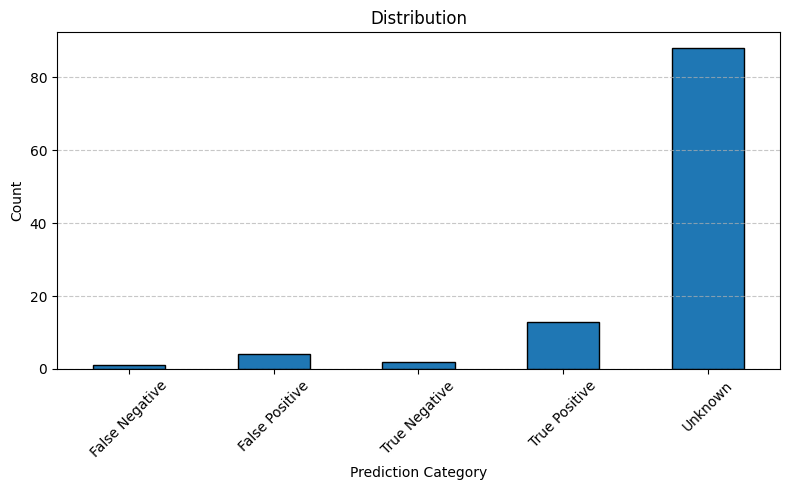

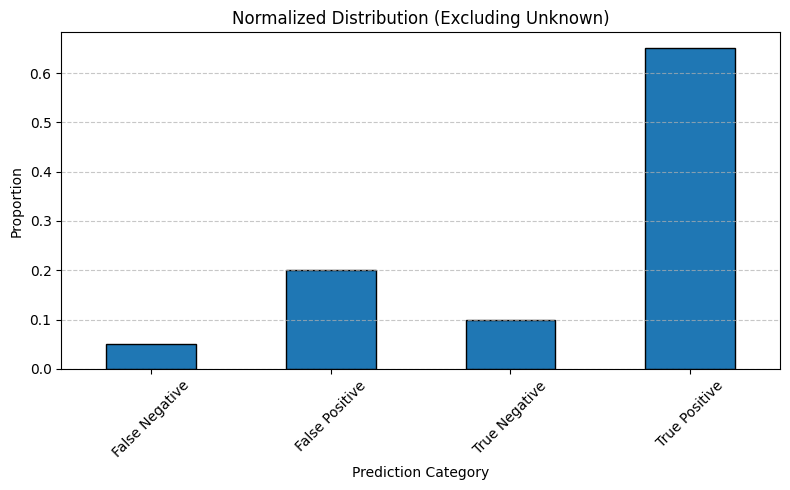

In [3]:
# Load the updated Raikoke results and Kuril Islands data
raikoke_preds = pd.read_csv("../results/Kuril_Islands/Raikoke_res.csv")
kuril_data = pd.read_excel("../../data/CloudFree_ASTER_files/Volcano_Thermal_TimeSeries_Spreadsheets/Kuril_Islands/Kuril_Islands_DataTable.xlsx", sheet_name="Raikoke")

# Convert dates to datetime format
raikoke_preds["Date"] = pd.to_datetime(raikoke_preds["Date"], errors="coerce")
kuril_data["Date"] = pd.to_datetime(kuril_data["Date"], errors="coerce")

# Merge predictions with ground truth VTF area on Date
merged = pd.merge(raikoke_preds, kuril_data[["Date", "VTF area"]], on="Date", how="left")

# Create ground truth label where:
# - VTF area > 0 ➝ 1
# - VTF area == 0 ➝ 0
# - VTF area is NaN ➝ remains NaN
merged["label"] = merged["VTF area"].apply(lambda x: 1 if x > 0 else (0 if x == 0 else np.nan))

# Convert predicted Y/N to 1/0
merged["prediction"] = (merged["Volcanic Thermal Anomaly (Y/N)"] == "Y").astype(int)

# Classify into TP, TN, FP, FN
def classify(row):
    if row["label"] == 1 and row["prediction"] == 1:
        return "True Positive"
    elif row["label"] == 0 and row["prediction"] == 0:
        return "True Negative"
    elif row["label"] == 0 and row["prediction"] == 1:
        return "False Positive"
    elif row["label"] == 1 and row["prediction"] == 0:
        return "False Negative"
    return "Unknown"

merged["category"] = merged.apply(classify, axis=1)

# Describe numeric columns in the merged dataframe
numeric_stats = merged.describe(include='number')

# Include counts of non-numeric columns like category
non_numeric_counts = merged["category"].value_counts().to_frame(name="count")
print(non_numeric_counts)

import matplotlib.pyplot as plt

# Count the number of samples per prediction category
category_counts = merged["category"].value_counts().sort_index()

# Plot histogram
plt.figure(figsize=(8, 5))
category_counts.plot(kind="bar", edgecolor="black")
plt.title("Distribution")
plt.xlabel("Prediction Category")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Filter out 'Unknown' category
filtered_counts = category_counts[category_counts.index != "Unknown"]

# Normalize the counts
normalized_counts = filtered_counts / filtered_counts.sum()

# Plot normalized histogram
plt.figure(figsize=(8, 5))
normalized_counts.plot(kind="bar", edgecolor="black")
plt.title("Normalized Distribution (Excluding Unknown)")
plt.xlabel("Prediction Category")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

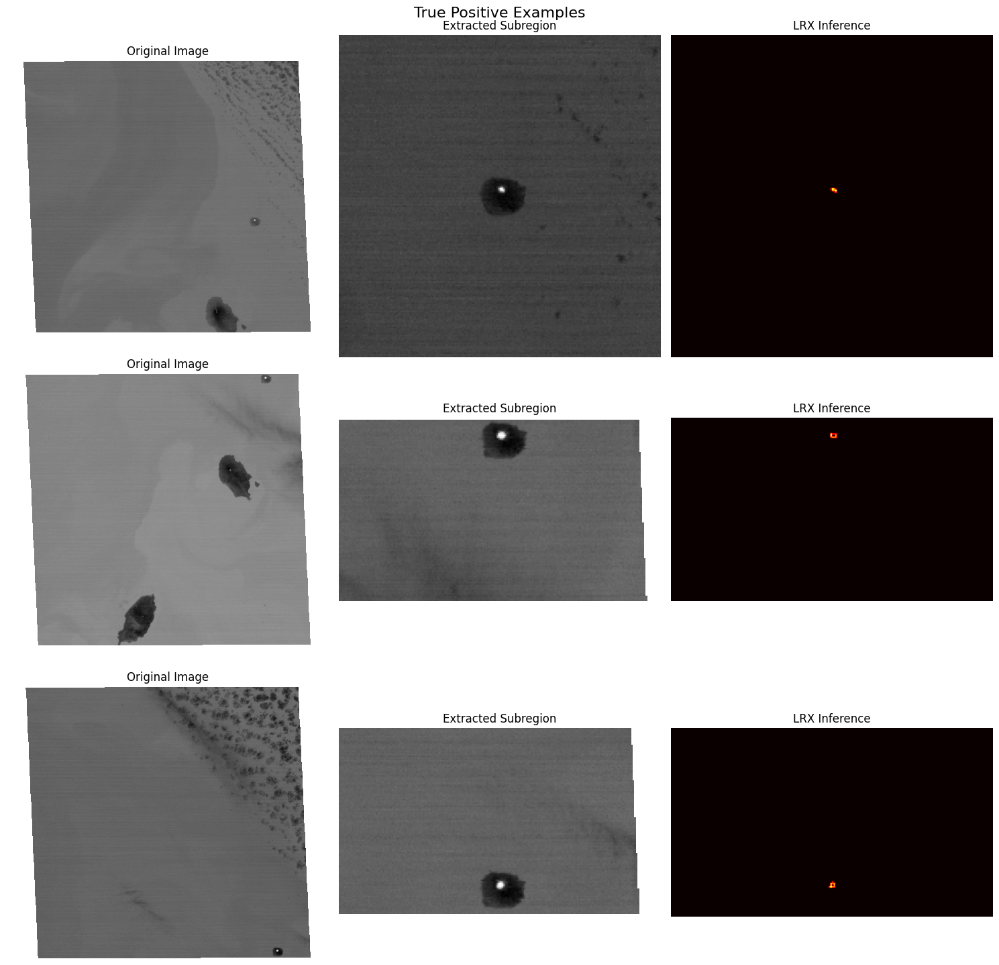

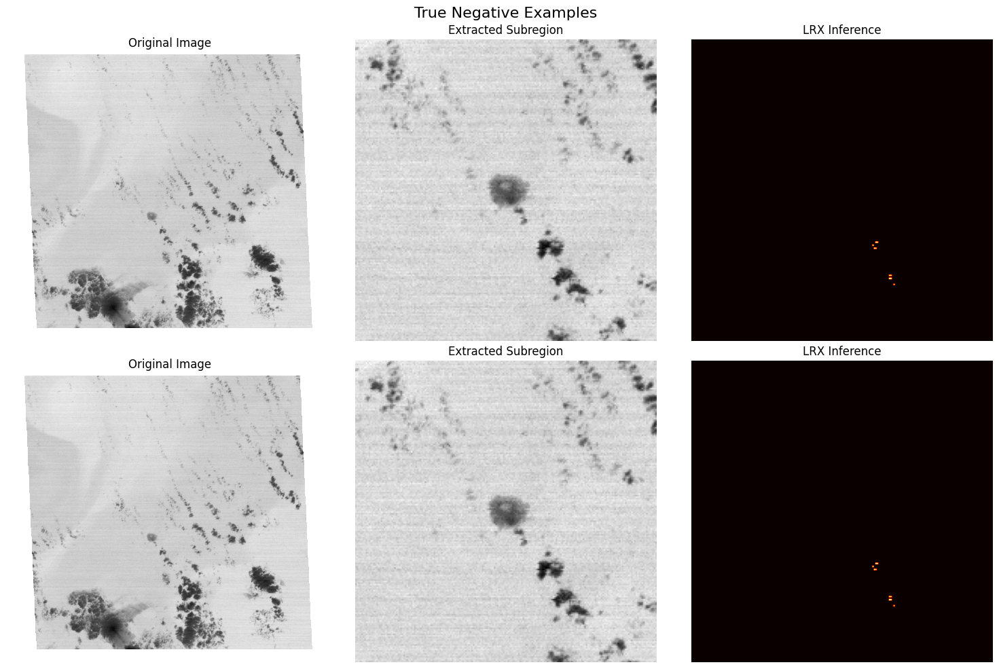

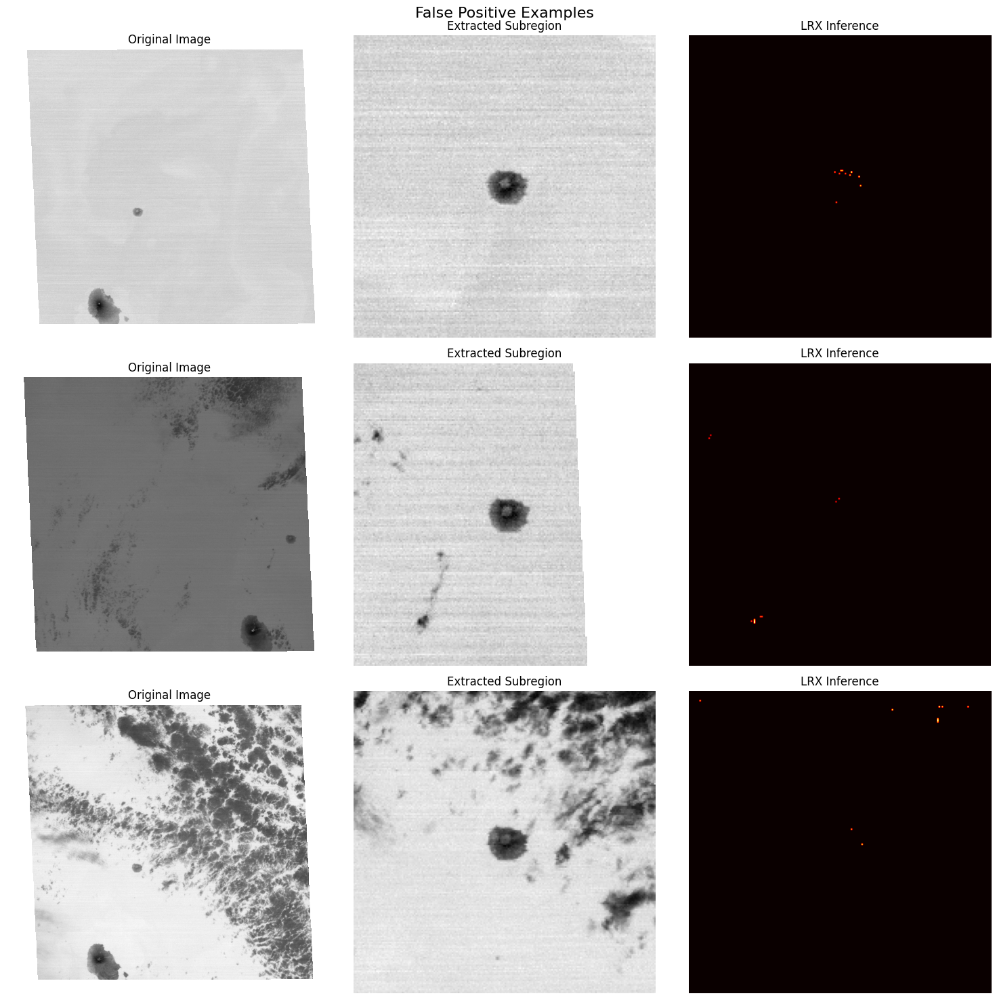

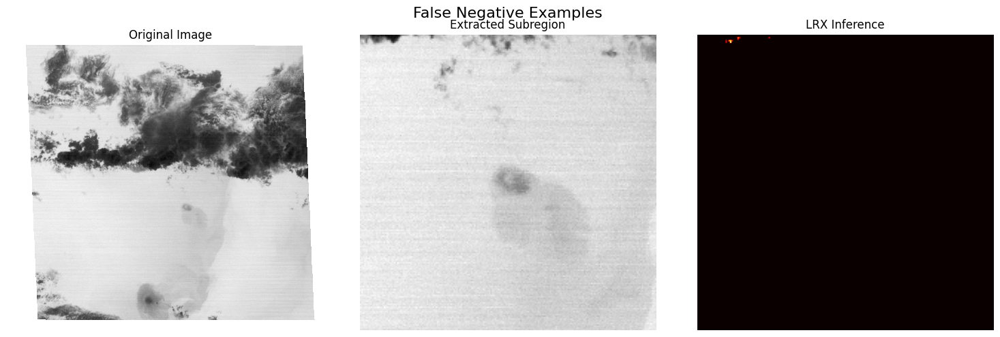

In [4]:
# Load merged DataFrame from earlier step
df = merged

# If not already present:
if "category" not in df.columns:
    conditions = [
        (df['label'] == 1) & (df['prediction'] == 1),
        (df['label'] == 0) & (df['prediction'] == 0),
        (df['label'] == 0) & (df['prediction'] == 1),
        (df['label'] == 1) & (df['prediction'] == 0),
    ]
    choices = ['True Positive', 'True Negative', 'False Positive', 'False Negative']
    df['category'] = np.select(conditions, choices, default='Unknown')

# Plot random examples from each category
for cat in ['True Positive', 'True Negative', 'False Positive', 'False Negative']:
    plot_random_examples( 'Raikoke', df, cat)


## Example 2: Ebeko

   Unnamed: 0       Date Volcano Volcanic Thermal Anomaly (Y/N)  Maximum (K)  \
0           0 2001-01-07   Ebeko                              N          NaN   
1           1 2008-09-07   Ebeko                              N          NaN   
2           2 2015-01-23   Ebeko                              N          NaN   
3           3 2002-10-02   Ebeko                              Y        249.5   
4           4 2004-08-20   Ebeko                              Y        279.2   

   Mean (Background Temperature) (K)  Standard Deviation  \
0                                NaN                 NaN   
1                                NaN                 NaN   
2                                NaN                 NaN   
3                         248.242500            1.837582   
4                         275.780833            1.284234   

   Max Temp Above Background (K)  \
0                            NaN   
1                            NaN   
2                            NaN   
3             

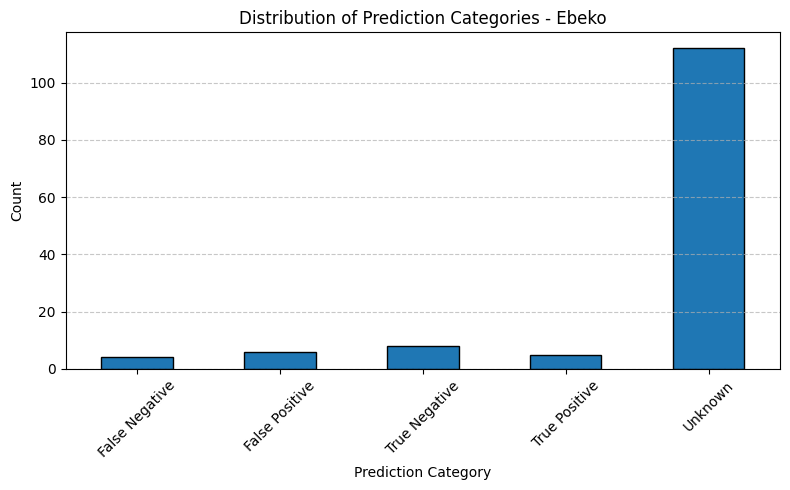

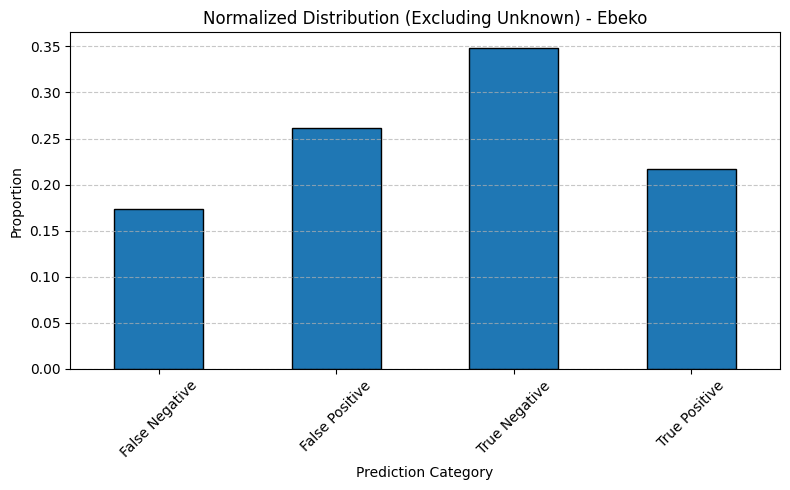

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the updated Ebeko results and Kuril Islands data
ebeko_preds = pd.read_csv("../results/Kuril_Islands/Ebeko_res.csv")
kuril_data = pd.read_excel("../../data/CloudFree_ASTER_files/Volcano_Thermal_TimeSeries_Spreadsheets/Kuril_Islands/Kuril_Islands_DataTable.xlsx", sheet_name="Ebeko")

# Convert dates to datetime format
ebeko_preds["Date"] = pd.to_datetime(ebeko_preds["Date"], errors="coerce")
kuril_data["Date"] = pd.to_datetime(kuril_data["Date"], errors="coerce")

# Merge predictions with ground truth VTF area on Date
merged = pd.merge(ebeko_preds, kuril_data[["Date", "VTF area"]], on="Date", how="left")

# Create ground truth label:
# - VTF area > 0 ➝ 1
# - VTF area == 0 ➝ 0
# - VTF area is NaN ➝ remains NaN
merged["label"] = merged["VTF area"].apply(lambda x: 1 if x > 0 else (0 if x == 0 else np.nan))

# Convert predicted Y/N to 1/0
merged["prediction"] = (merged["Volcanic Thermal Anomaly (Y/N)"] == "Y").astype(int)

# Classify into TP, TN, FP, FN
def classify(row):
    if row["label"] == 1 and row["prediction"] == 1:
        return "True Positive"
    elif row["label"] == 0 and row["prediction"] == 0:
        return "True Negative"
    elif row["label"] == 0 and row["prediction"] == 1:
        return "False Positive"
    elif row["label"] == 1 and row["prediction"] == 0:
        return "False Negative"
    return "Unknown"

merged["category"] = merged.apply(classify, axis=1)

# Display results
print(merged.head())

# Get numeric and category stats
numeric_stats = merged.describe(include='number')
non_numeric_counts = merged["category"].value_counts().to_frame(name="count")
print(non_numeric_counts)

# Plot raw distribution
category_counts = merged["category"].value_counts().sort_index()

plt.figure(figsize=(8, 5))
category_counts.plot(kind="bar", edgecolor="black")
plt.title("Distribution of Prediction Categories - Ebeko")
plt.xlabel("Prediction Category")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Plot normalized distribution (excluding Unknown)
filtered_counts = category_counts[category_counts.index != "Unknown"]
normalized_counts = filtered_counts / filtered_counts.sum()

plt.figure(figsize=(8, 5))
normalized_counts.plot(kind="bar", edgecolor="black")
plt.title("Normalized Distribution (Excluding Unknown) - Ebeko")
plt.xlabel("Prediction Category")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


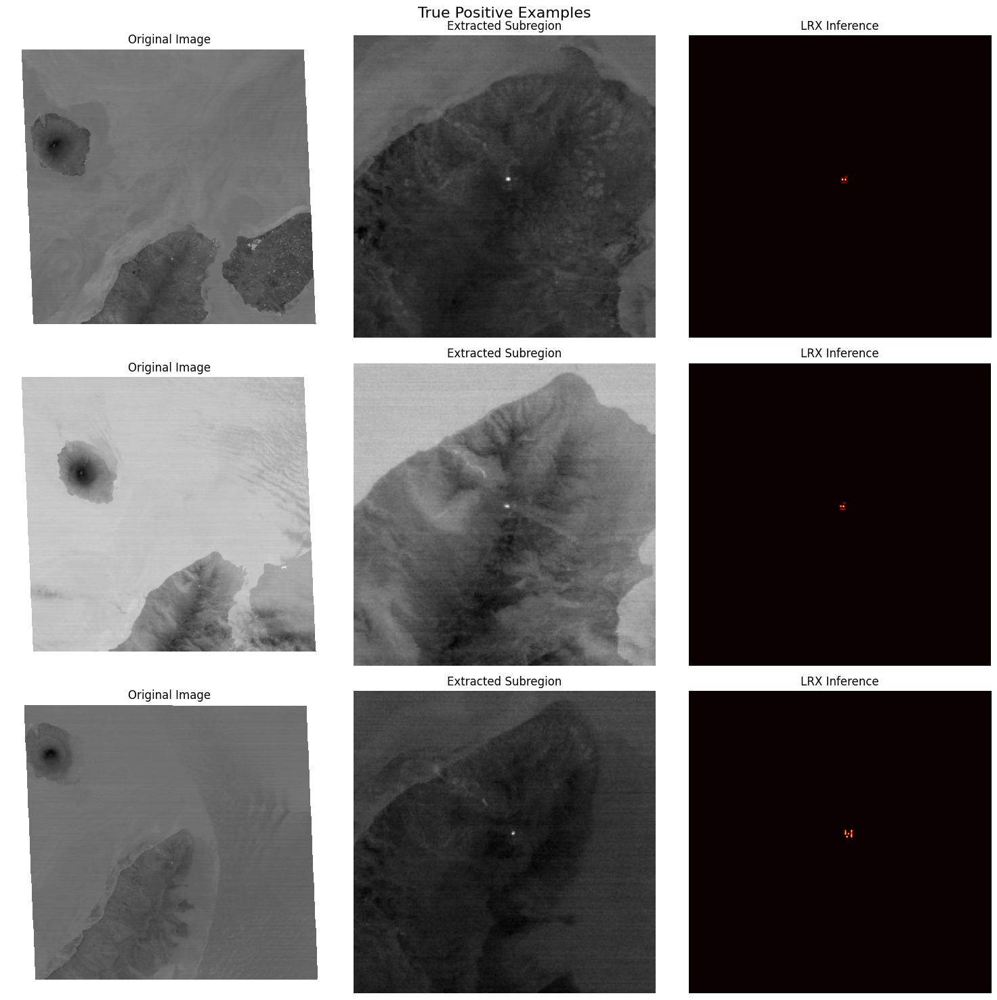

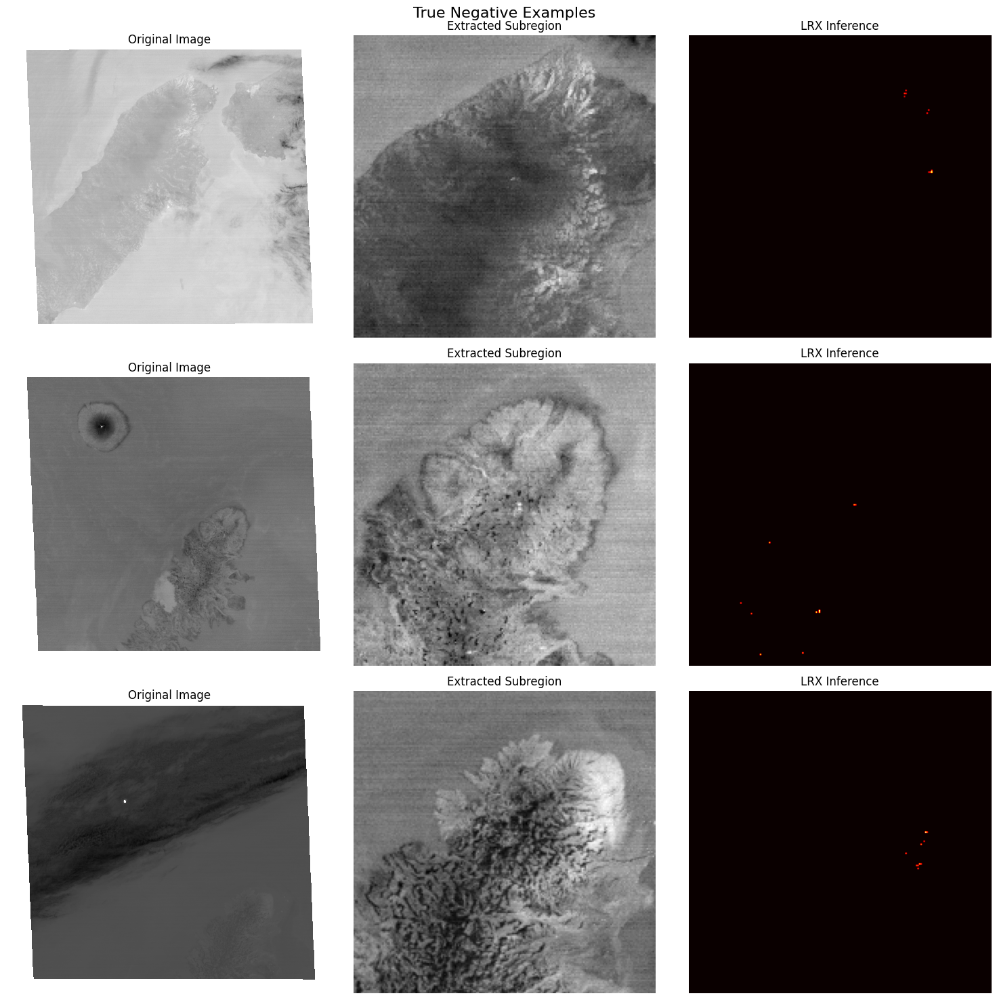

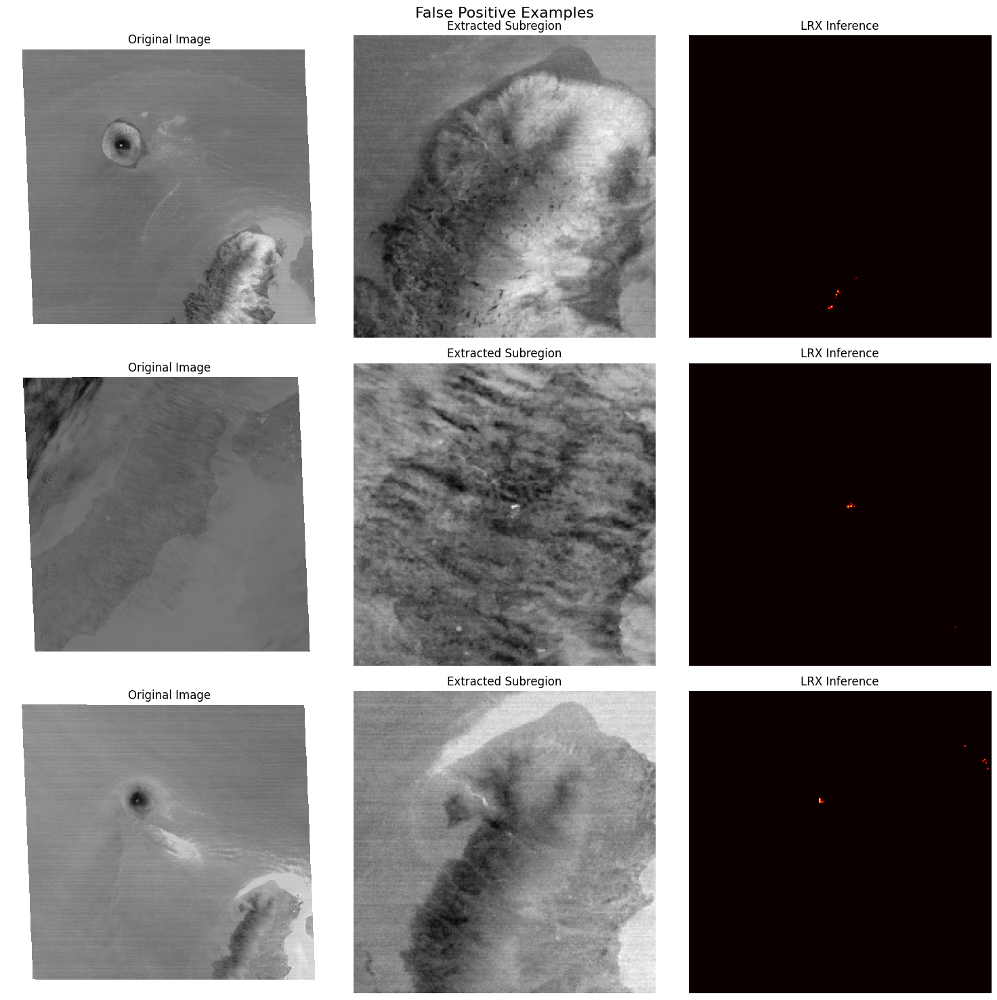

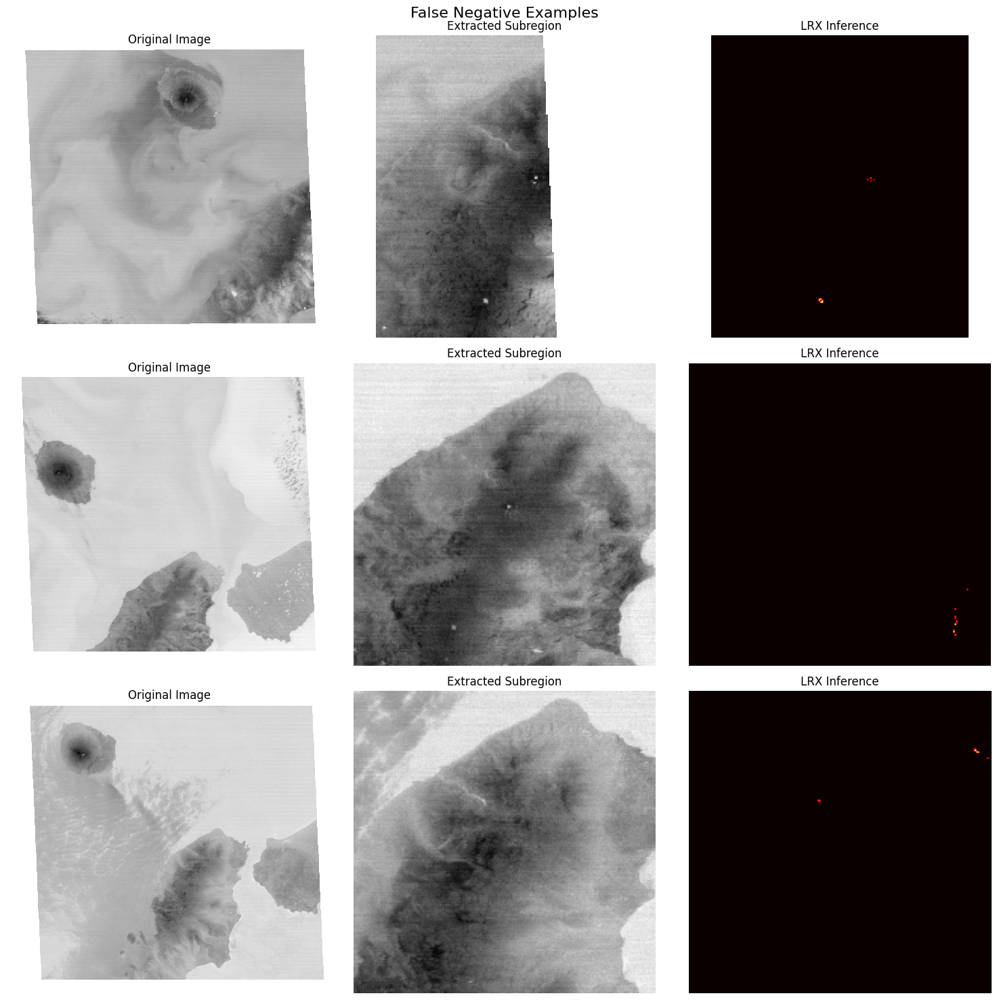

In [6]:
# Load merged DataFrame from earlier step
df = merged

# If not already present:
if "category" not in df.columns:
    conditions = [
        (df['label'] == 1) & (df['prediction'] == 1),
        (df['label'] == 0) & (df['prediction'] == 0),
        (df['label'] == 0) & (df['prediction'] == 1),
        (df['label'] == 1) & (df['prediction'] == 0),
    ]
    choices = ['True Positive', 'True Negative', 'False Positive', 'False Negative']
    df['category'] = np.select(conditions, choices, default='Unknown')

# Plot random examples from each category
for cat in ['True Positive', 'True Negative', 'False Positive', 'False Negative']:
    plot_random_examples( 'Ebeko', df, cat)


## Example 3: La Palma

   Unnamed: 0       Date   Volcano Volcanic Thermal Anomaly (Y/N)  \
0           0 2004-06-11  La_Palma                              N   
1           1 2006-10-07  La_Palma                              N   
2           2 2001-03-06  La_Palma                              N   
3           3 2001-03-22  La_Palma                              N   
4           4 2009-07-27  La_Palma                              N   

   Maximum (K)  Mean (Background Temperature) (K)  Standard Deviation  \
0          NaN                                NaN                 NaN   
1          NaN                                NaN                 NaN   
2          NaN                                NaN                 NaN   
3          NaN                                NaN                 NaN   
4          NaN                                NaN                 NaN   

   Max Temp Above Background (K)  \
0                            NaN   
1                            NaN   
2                            NaN   
3 

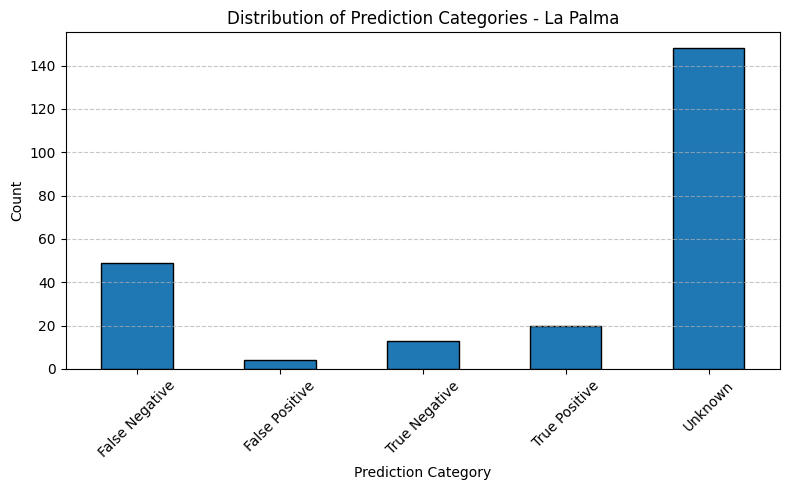

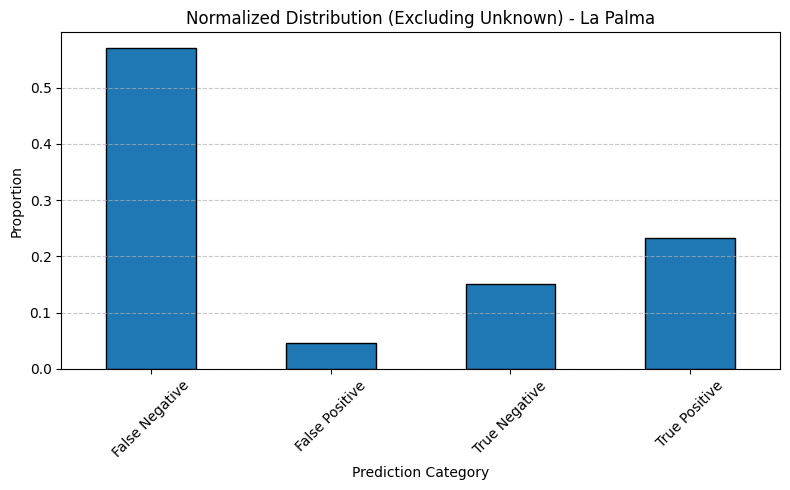

In [7]:
# Load the updated La_Palma results and Atlantic Ocean data
palma_preds = pd.read_csv("../results/Atlantic_Ocean/La_Palma_res.csv")
atlantic_data = pd.read_excel("../../data/CloudFree_ASTER_files/Volcano_Thermal_TimeSeries_Spreadsheets/Atlantic_Ocean/Atlantic_Ocean_DataTable.xlsx", sheet_name="La_Palma")

# Convert dates to datetime format
palma_preds["Date"] = pd.to_datetime(palma_preds["Date"], errors="coerce")
atlantic_data["Date"] = pd.to_datetime(atlantic_data["Date"], errors="coerce")

# Merge predictions with ground truth VTF area on Date
merged = pd.merge(palma_preds, atlantic_data[["Date", "VTF area"]], on="Date", how="left")

# Create ground truth label:
# - VTF area > 0 ➝ 1
# - VTF area == 0 ➝ 0
# - VTF area is NaN ➝ remains NaN
merged["label"] = merged["VTF area"].apply(lambda x: 1 if x > 0 else (0 if x == 0 else np.nan))

# Convert predicted Y/N to 1/0
merged["prediction"] = (merged["Volcanic Thermal Anomaly (Y/N)"] == "Y").astype(int)

# Classify into TP, TN, FP, FN
def classify(row):
    if row["label"] == 1 and row["prediction"] == 1:
        return "True Positive"
    elif row["label"] == 0 and row["prediction"] == 0:
        return "True Negative"
    elif row["label"] == 0 and row["prediction"] == 1:
        return "False Positive"
    elif row["label"] == 1 and row["prediction"] == 0:
        return "False Negative"
    return "Unknown"

merged["category"] = merged.apply(classify, axis=1)

# Display results
print(merged.head())

# Get numeric and category stats
numeric_stats = merged.describe(include='number')
non_numeric_counts = merged["category"].value_counts().to_frame(name="count")
print(non_numeric_counts)

# Plot raw distribution
category_counts = merged["category"].value_counts().sort_index()

plt.figure(figsize=(8, 5))
category_counts.plot(kind="bar", edgecolor="black")
plt.title("Distribution of Prediction Categories - La Palma")
plt.xlabel("Prediction Category")
plt.ylabel("Count")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()

# Plot normalized distribution (excluding Unknown)
filtered_counts = category_counts[category_counts.index != "Unknown"]
normalized_counts = filtered_counts / filtered_counts.sum()

plt.figure(figsize=(8, 5))
normalized_counts.plot(kind="bar", edgecolor="black")
plt.title("Normalized Distribution (Excluding Unknown) - La Palma")
plt.xlabel("Prediction Category")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.tight_layout()
plt.show()


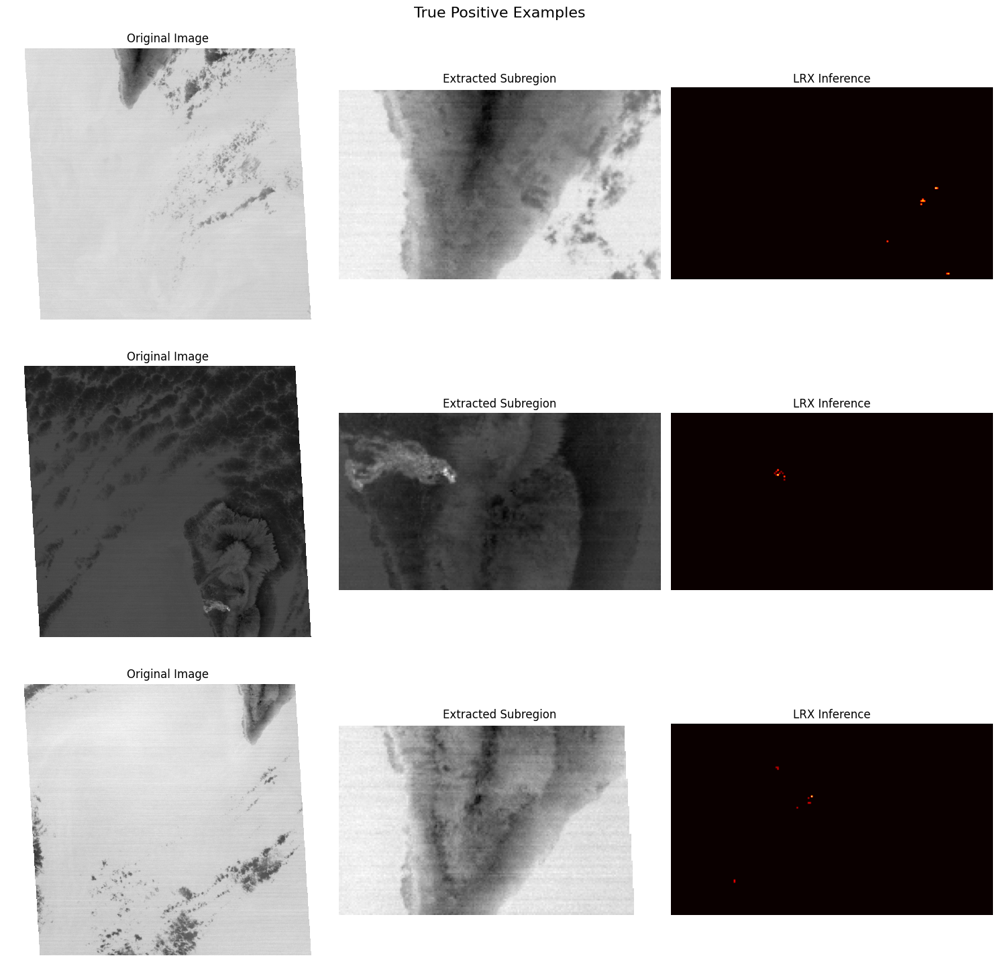

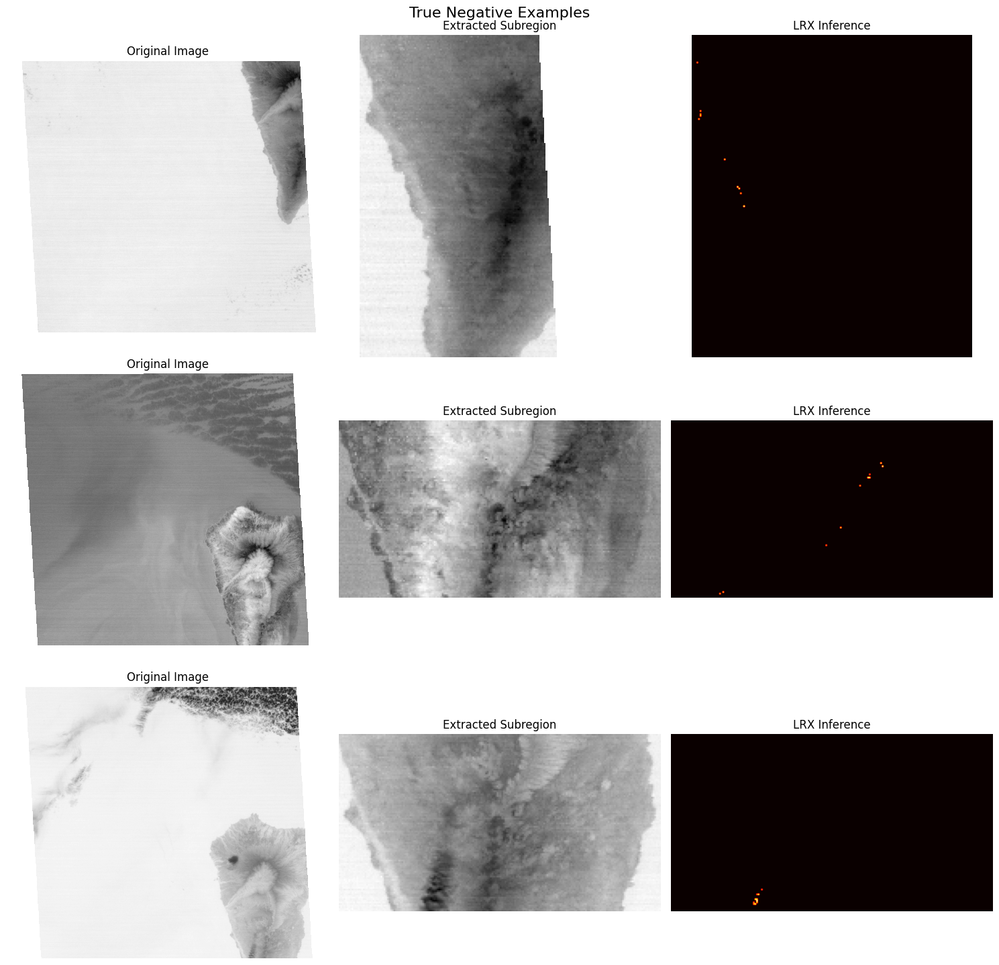

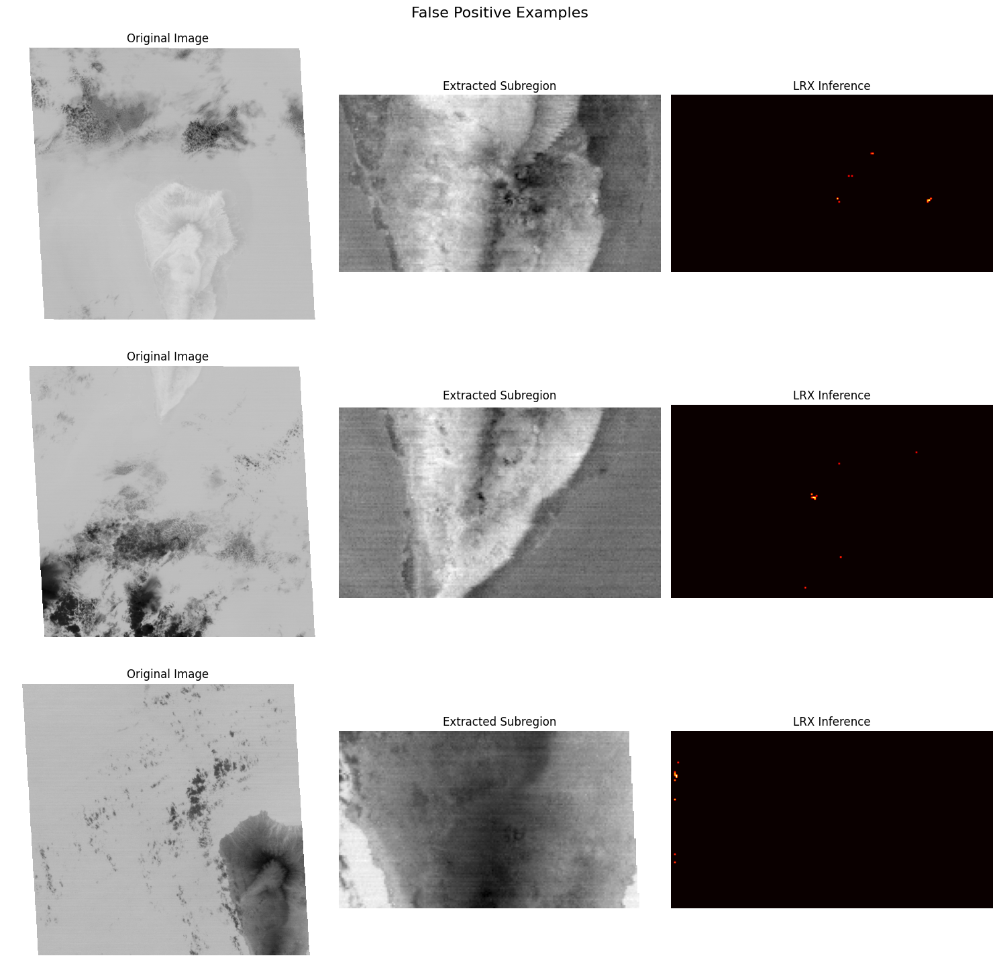

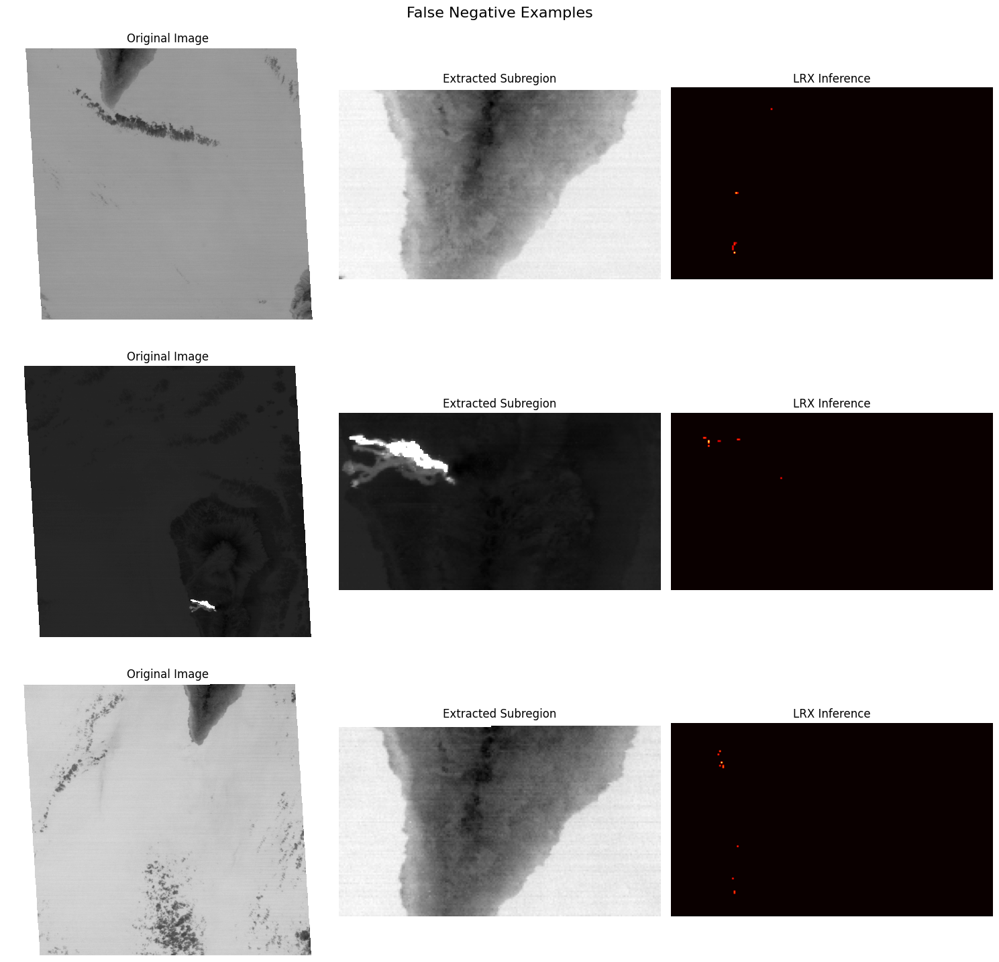

In [8]:
# Load merged DataFrame from earlier step
df = merged 

# Add category column if not present
if "category" not in df.columns:
    conditions = [
        (df['label'] == 1) & (df['prediction'] == 1),
        (df['label'] == 0) & (df['prediction'] == 0),
        (df['label'] == 0) & (df['prediction'] == 1),
        (df['label'] == 1) & (df['prediction'] == 0),
    ]
    choices = ['True Positive', 'True Negative', 'False Positive', 'False Negative']
    df['category'] = np.select(conditions, choices, default='Unknown')

# Plot random examples from each category for Ebeko
for cat in ['True Positive', 'True Negative', 'False Positive', 'False Negative']:
    plot_random_examples('La_Palma', df, cat)

